# Tarea 2. Análisis de Componentes Principaleas
## Esteban Reyes Saldaña

## Resumen
En esta tarea se implementó un método de PCA para encontrar los componentes principales de un conjunto de imágenes en formato "jpg". El conjunto de entrenamiento consta de diez imágenes y se usaron tres imágenes para pruebas. Como parámetros generales se tienen
1. El número de imágenes de entrenamiento $ M $.
2. Valor $ \theta \in [0,1] $ que representa la varianza total explicada por los componentes.
3. El tamaño $ l \times l $ de los parches a extraer de las imágenes.
4. El número total de parches $ m $ a extraer de todas las imágenes.
5. El número de imágenes para pruebas $ N $.

## Objetivo
Una vez que se obtengan los componentes principales, se proyectarán los parches de tamaño $ l \times l $ de las imágenes de prueba al espacio de componentes y luego se regresará al espacio original para comparar la reconstrucción.

In [26]:
# Parámetros Sugeridos
M = 10
N = 3
l = {16, 32}
m = 1000
# dimensiones de imagen 512 x 512 x 3

In [27]:
# Librerias necesarias
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.feature_extraction import image

1. Obtención de la muestra: dado un conjunto de imágenes $ \{ I \}_{i = 1, 2,\dots, M} $ de las cuales seleccione $ m $ parches (subimágenes al azar) de dimensión $ (l, l) $ pixeles de los canales algún canal de color seleccionado también al azar.

In [28]:
I = [mpimg.imread('dataset/' + str(i+1) + '.jpg') for i in range(M)]

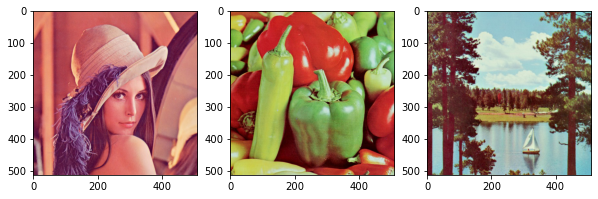

In [29]:
f, axs = plt.subplots(1,3, figsize=[10,10])
for i in range(3): axs[i].imshow(I[i])

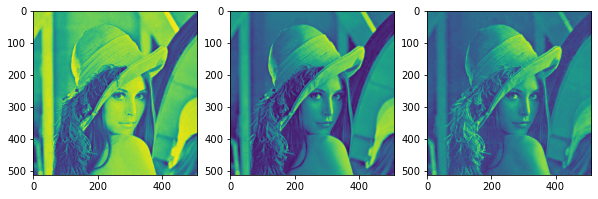

In [30]:
# Canales de Colores
f, axs = plt.subplots(1,3, figsize=[10,10])
for i in range(3): axs[i].imshow(I[0][:, :, i])

2. Arregle la muestra acorde a la matriz de dimensión $ (m, n) $ con $ n = l \times l : $
$$ X = \left[ \begin{matrix} x_1^T \\ x_2^T \\ \vdots \\ x_m^T \end{matrix} \right] $$
donde $ x_i^T $ es el $ i $ - ésimo parche formateado como vector (renglón tras renglón) al cualse le restó la media por columnas (datos centrados).

In [31]:
def get_X_matrix (m, l , I):
    '''
    Obtiene matriz de parches X
    
    Parámetros
    -----------
        m     : Número de parches a obtener
        l     : Tamaño de cada parche
        I     : matriz de imágenes
    Regresa
    -----------
        X     : Matriz de parches vectorizados
        means : Vector de promedios por columna
    '''
    
    # Elijo aleatoriamente imagenes y canales
    images_order   = np.random.randint(0,10, size = m)
    channels_order = np.random.randint(0,3, size = m)

    X = []
    for i in range(m):
        # Extraigo de manera aleatoria un parche del total de parches de la imagen y canal seleccionados
        x_i = image.extract_patches_2d(I[images_order[i]][: , :, channels_order[i]] , (l, l), max_patches = 1)
                
        # Agrego a matriz principal como vector
        X.append(np.reshape(x_i, -1))
        
    # vector de medias
    means = np.mean(X, axis = 0)
        
    # Centro matriz
    X = X - means

    return np.array(X), means

In [32]:
X, means = get_X_matrix(m, 16, I)

print(X.shape)

(1000, 256)


3. Calcule los componentes principales de $ X $.

4. Sean $ \Lambda = diag (\lambda_1, \lambda_2, \dots, \lambda_m) $, con $ \lambda_i \geq \lambda_j $ para $ i < j $, los eigenvalores de 
$$ X^T X $$
y las columnas de $ U = [u_1, u_2, \dots, u_m] $ los eigenvectores correspondientes. Entonces seleccione los primeros $ K $ eigenvectores $ \{ u_k \}_{k = 1, 2, \dots, K} $ tal que
$$ K = \arg \inf_{k} \left( \sum_{i = 1}^k \lambda_i \geq \theta \sum_{i = 1}^m \lambda_i \right) $$
la suma de los $ K $ primeros eigenvalores seleccionados corresponde a al menos la fracción $ \theta $ (con $ 0 \leq \theta \leq 1 $ ) de la suma de todos los eigenvalores.

In [33]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import normalize

In [34]:
def get_PCA (theta, X):
    clf      = PCA(theta)
    X_train  = X
    X_train  = clf.fit_transform(X_train)
      
    eigenval = clf.explained_variance_
    eigenvec = clf.components_
    
    # Normalizo vector de valores propios
    eigenvec = normalize(eigenvec)
        
    return eigenval, eigenvec

In [35]:
theta = 0.99
eigenval, eigenvec = get_PCA(theta, X)

print("Número de componetes: ", eigenvec.shape[0])

Número de componetes:  51


5. Construya la matriz de transformación
$$ \tilde{U} = [u_1, u_2, \dots, u_K] $$

In [36]:
print(eigenvec.T.shape)

(256, 51)


6. Para un conjunto de imágenes de prueba $ \{ J \}_{i = 1, 2, \dots, N} $ calcule los coeficientes en el espacio comprimido para cada bloque no sobrelapado de $ ( l, l ) $
$$ \beta_i = \tilde{U}^T x_i  $$
para todo parche $ i $ en cada imagen de $ \{ J \} $.

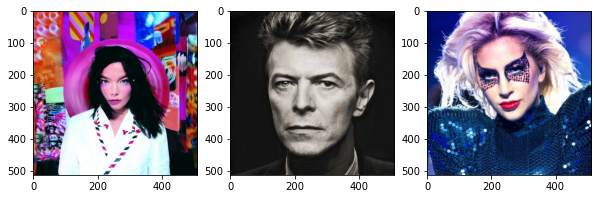

In [37]:
# Cargo imágenes de prueba
test_id = [i+M+1 for i in range(N)]

J = [mpimg.imread('dataset/' + str(i) + '.jpg') for i in test_id]

# Imagen de prueba
f, axs = plt.subplots(1,3, figsize=[10,10])
for i in range(3): axs[i].imshow(J[i])

In [38]:
from skimage.util import view_as_windows

In [39]:
def extract_grid(Image, l):
    '''
    Obtiene parches no translapados de imagen de prueba
    
    Parámetros
    -----------
        Image   : Imagen de la que se quiere extraer patches
        l       : dimensión de los parches
    Regresa
    -----------
        patches : Array de parches sin translape
    '''
    
    channels = Image.shape[2]                             
    n_patches = int(Image.shape[0]/l * Image.shape[0]/l) 
    
    full_image = []
    # Recorro cada matriz en todos los canales
    for c in range(channels):
        # creo parches no traslapados
        path = view_as_windows(Image[ : , : , c], (l,l), l)
        # size (1024, 16*16)
        path = path.reshape(n_patches, l*l)
        # Agrego a imagen 
        full_image.append(path)
        
    return np.array(full_image)

In [40]:
def get_patches(N, J, l):
    '''
    Parámetros
    -----------
        N : Número de imágenes de prueba
        J : Tensor de imágenes
        l : tamaño de parches
    Regresa
    ----------
        J_patches: Parches del conjunto de prueba
        
    '''
    J_patches = []
    
    for i in range(N):
        J_patches.append(extract_grid(J[i], l))
    J_patches = np.array(J_patches)
    
    return np.array(J_patches)

In [41]:
# Extraigo parches de imagenes
J_patches = get_patches(N, J, 16)

print(J_patches.shape)

(3, 3, 1024, 256)


In [42]:
# Proyecto imagenes a espacio de vectores propios
def proyection(U_T, means, J):
        '''
        Parámetros
        -----------
            U_T   : Matriz de eigenvectores
            means : Vector de medias de entrenamiento
            J     : Matriz de parches (3, 1024, 256)
        Regresa
        ----------
            JP    : Matriz de proyección (3, 1024, 60)
        '''
        Proyection = []
        channels   = J.shape[0]   # 3  
        n_patches  = J.shape[1]   # 1024
        for c in range(channels) :
            JP = []
            for i in range(n_patches):
                beta = J[c][i] - means
                beta = np.dot(U_T, beta)
                
                JP.append(beta)
            Proyection.append(JP)

        return np.array(Proyection)

In [43]:
def get_proyection(N, eigenvec, means, J_patches):
    '''
    Parámetros
    -----------
        N        : Número de imágenes de prueba
        eigenvec : matriz de eigenvectores
        means    : Vector de medias del conjunto de entrenamiento
                
    Regresa
        Beta : Coeficientes de proyecciones en espacio de componentes
    -----------
    '''
    Beta = []
    for i in range(N):
        Beta.append(proyection(eigenvec, means, J_patches[i]))
    
    return np.array(Beta)


In [44]:
# Obtengo proyecciones
Beta = get_proyection(N, eigenvec, means, J_patches)

print(Beta.shape)

(3, 3, 1024, 51)


7. Reconstruya cada imagen, parche por parche, usando los coeficientes $ \beta $
$$ x_i = \tilde{U} \beta_i  $$
para todo parche $ i $ en cada imagen de $ \{ J \} $.

In [45]:
def reconstruction(U, means, J):
    '''
    Parámetros
    -----------
        U     : Matriz de eigenvectores
        means : Vector de medias de entrenamiento
        JP    : Matriz de parches proyectados (3, 1024, 60)
    Regresa
    ----------
        J     : Matriz de proyección (3, 1024, 256)
    '''
    Proyection = []
    channels   = J.shape[0]   # 3  
    n_patches  = J.shape[1]   # 60
    for c in range(channels) :
        JP         = []
        for i in range(n_patches):
            beta = np.dot(U, J[c][i])
            beta = beta + means

            JP.append(beta)
        Proyection.append(JP)

    return np.array(Proyection)

In [46]:
def get_reconstruction(N, eigenvec_T, means, Beta):
    XP = []
    for i in range(N):
        XP.append(reconstruction(eigenvec_T, means, Beta[i]))
        
    # Arrregla escala de max-min para mostrar imagen
    XP = np.array(XP)
    XP[XP > 255] = 255
    XP[XP < 0  ] = 0
       
    return np.array(XP)

In [47]:
# Obtengo array de parches reconstruídos
XP = get_reconstruction(N, eigenvec.T, means, Beta)

print(XP.shape)

(3, 3, 1024, 256)


In [48]:
def build_image(IP, l = 16):
    channels   = IP.shape[0]   # 3 
    dim        = 512  # 3 
    rebuild = []
    
    for i in range(channels):
        patches = IP[i]
        for j in range(dim):
            patches = patches.reshape((dim, dim))
            patches = view_as_windows(patches, (l,l), l)
        patches = patches.reshape((dim, dim))
        rebuild.append(patches.T)
    return np.array(rebuild)

In [49]:
def build_test_images(N, J_test, l):
    reconstruction = []
    for n in range(N):
        reconstruction.append(build_image(J_test[n], l))   
    
    return np.array(reconstruction)

In [50]:
XP            = XP.astype(int)
reconstructed = build_test_images(N, XP, l = 16)

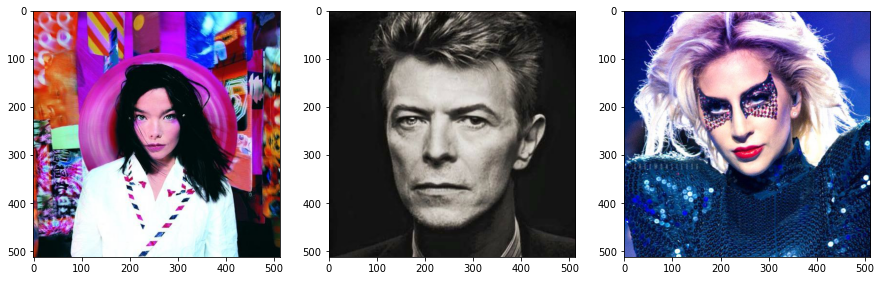

In [51]:
f, axs = plt.subplots(1, 3, figsize=[15,15])
for i in range(3): axs[i%N].imshow(J[i])

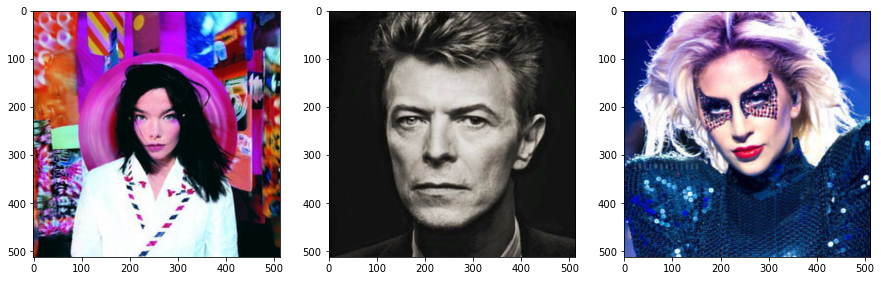

In [52]:
f, axs = plt.subplots(1, 3, figsize=[15,15])
for i in range(3): axs[i%N].imshow(reconstructed[i].T)

8. Muestre figuras con ejemplos de parches, imágenes de prueba $ J $, sus reconstrucciones $ \tilde{J} $ para distintas selecciones de $\theta$.

In [53]:
thetas = [0.6, 0.7, 0.8, 0.9, 0.95, 0.96, 0.97, 0.98, 0.99]
MAE    = []

In [54]:
from tabulate import tabulate

--------------------  ----
Tamaño de parche      16
Varianza Explicada     0.6
Número de componetes  54
--------------------  ----


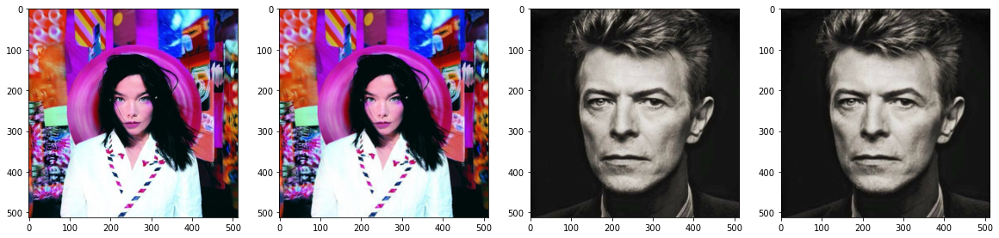

--------------------  ----
Tamaño de parche      16
Varianza Explicada     0.7
Número de componetes  52
--------------------  ----


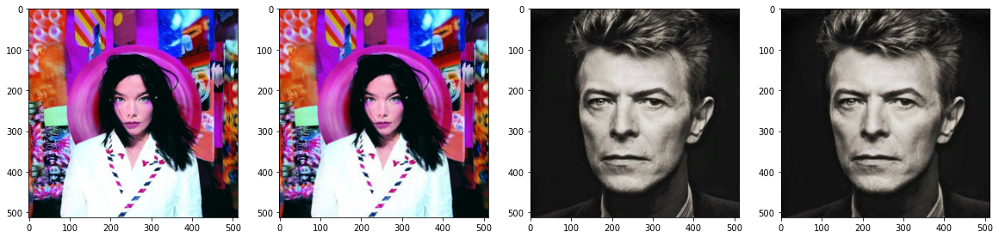

--------------------  ----
Tamaño de parche      16
Varianza Explicada     0.8
Número de componetes  51
--------------------  ----


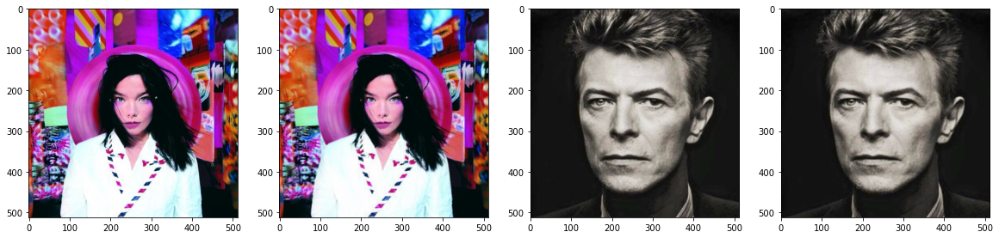

--------------------  ----
Tamaño de parche      16
Varianza Explicada     0.9
Número de componetes  51
--------------------  ----


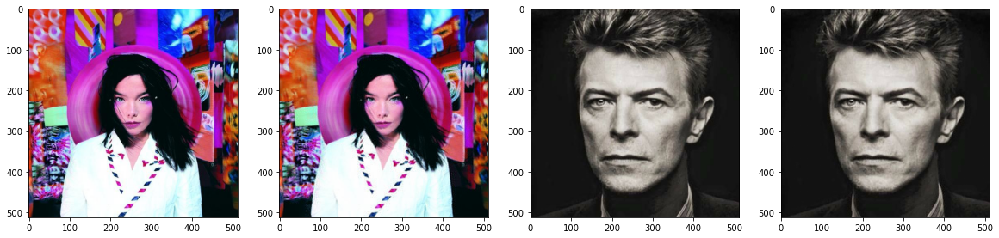

--------------------  -----
Tamaño de parche      16
Varianza Explicada     0.95
Número de componetes  49
--------------------  -----


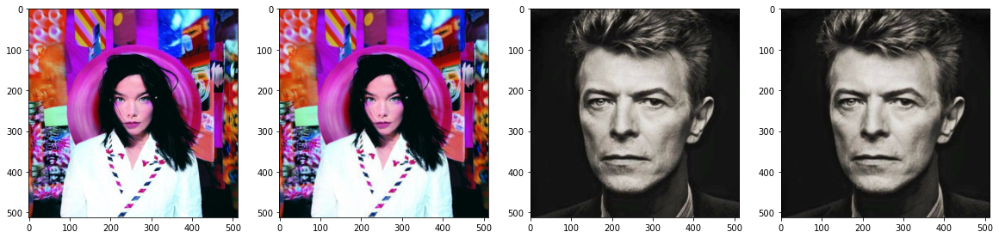

--------------------  -----
Tamaño de parche      16
Varianza Explicada     0.96
Número de componetes  51
--------------------  -----


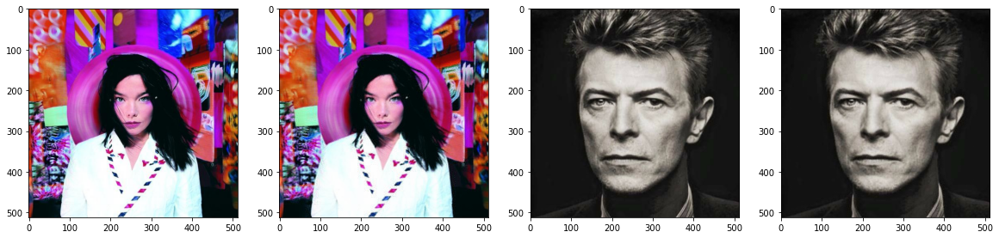

--------------------  -----
Tamaño de parche      16
Varianza Explicada     0.97
Número de componetes  49
--------------------  -----


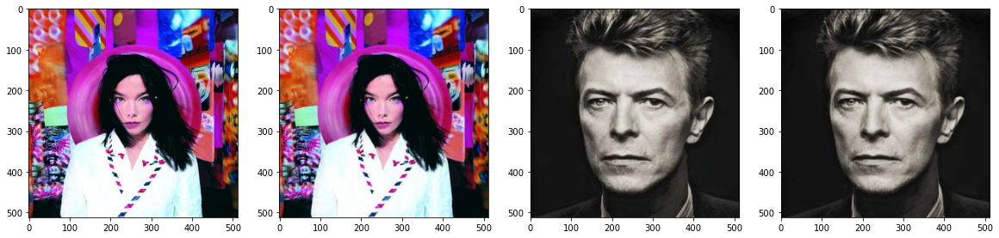

--------------------  -----
Tamaño de parche      16
Varianza Explicada     0.98
Número de componetes  47
--------------------  -----


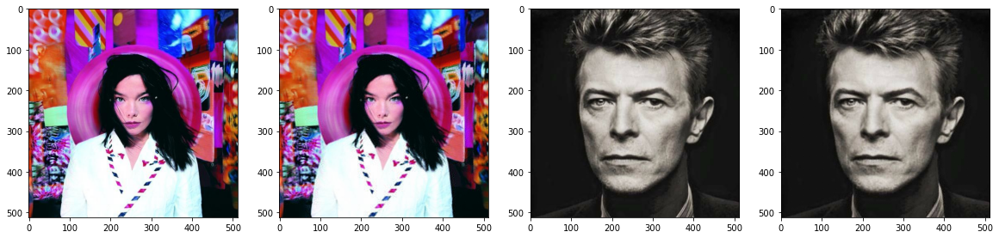

--------------------  -----
Tamaño de parche      16
Varianza Explicada     0.99
Número de componetes  43
--------------------  -----


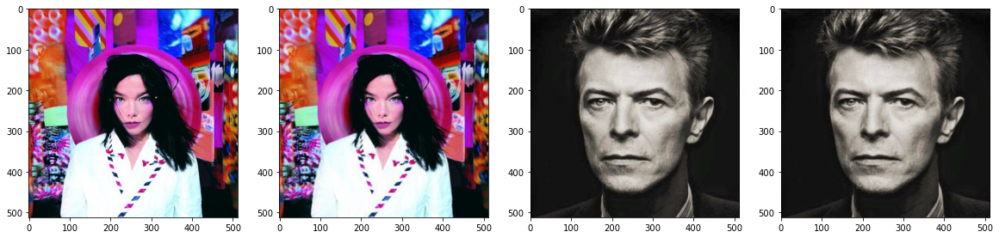

--------------------  -----
Tamaño de parche       32
Varianza Explicada      0.6
Número de componetes  130
--------------------  -----


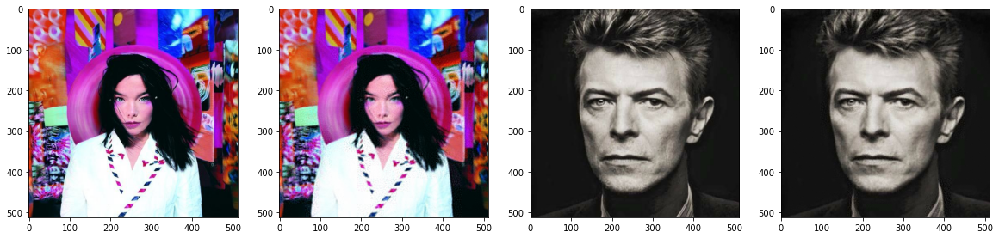

--------------------  -----
Tamaño de parche       32
Varianza Explicada      0.7
Número de componetes  118
--------------------  -----


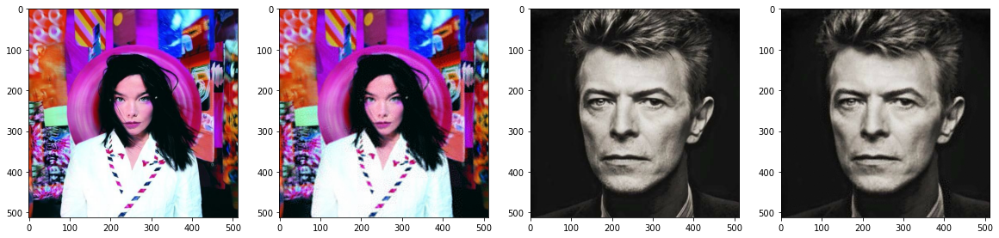

--------------------  -----
Tamaño de parche       32
Varianza Explicada      0.8
Número de componetes  127
--------------------  -----


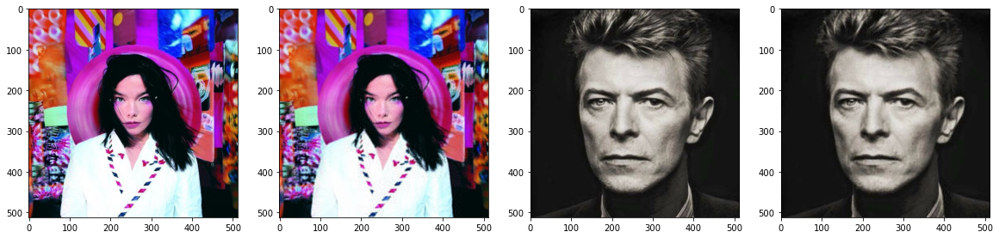

--------------------  -----
Tamaño de parche       32
Varianza Explicada      0.9
Número de componetes  127
--------------------  -----


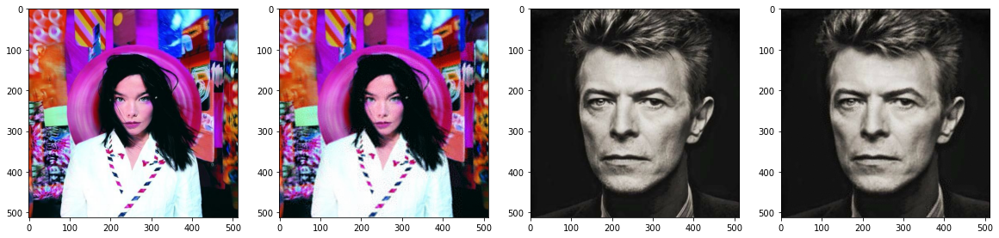

--------------------  ------
Tamaño de parche       32
Varianza Explicada      0.95
Número de componetes  132
--------------------  ------


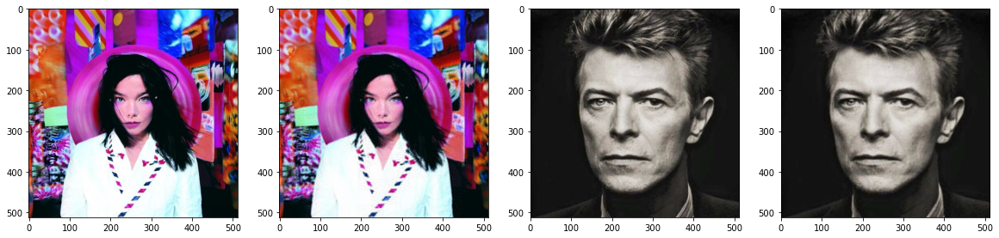

--------------------  ------
Tamaño de parche       32
Varianza Explicada      0.96
Número de componetes  135
--------------------  ------


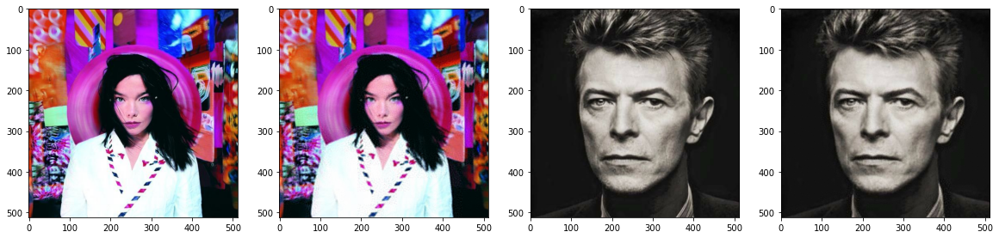

--------------------  ------
Tamaño de parche       32
Varianza Explicada      0.97
Número de componetes  126
--------------------  ------


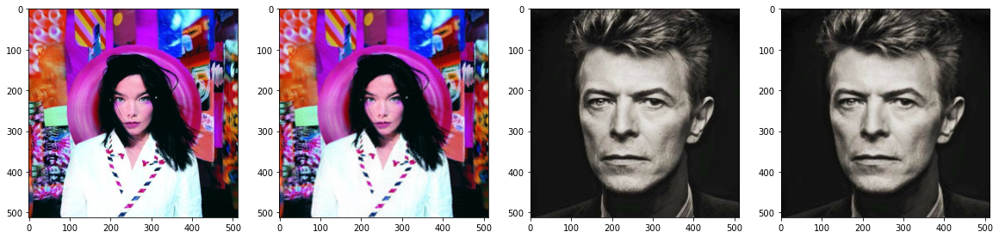

--------------------  ------
Tamaño de parche       32
Varianza Explicada      0.98
Número de componetes  133
--------------------  ------


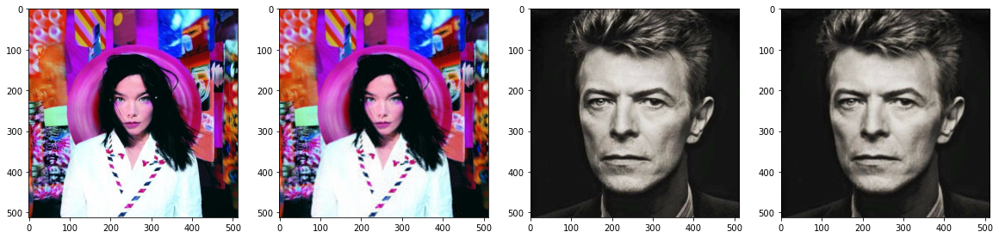

--------------------  ------
Tamaño de parche       32
Varianza Explicada      0.99
Número de componetes  127
--------------------  ------


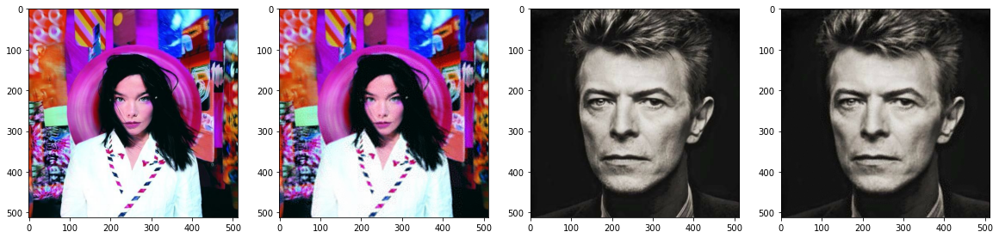

In [55]:
for patch_size in l:
    for t in thetas:
        X, means = get_X_matrix(m, patch_size, I)
        eigenval, eigenvec = get_PCA(theta, X)

        J_patches     = get_patches(N, J, l = patch_size)
        Beta          = get_proyection(N, eigenvec, means, J_patches)
        XP            = get_reconstruction(N, eigenvec.T, means, Beta)
        
        MAE.append(np.abs(J_patches - XP).sum()/3)
        XP            = XP.astype(int)
        reconstructed = build_test_images(N, XP, patch_size)
        

        
        
        # Print results
        table = ()
        print(tabulate([
                ['Tamaño de parche', patch_size], 
                ['Varianza Explicada', t], 
                ['Número de componetes', eigenvec.shape[0]]
                       ]))

        f, axs = plt.subplots(1, 4, figsize=[20,20])
        
        axs[0].imshow(J[0])
        axs[1].imshow(reconstructed[0].T)
        
        axs[2].imshow(J[1])
        axs[3].imshow(reconstructed[1].T)      
        
        plt.show()
        

9. Genere una gráfica de error absoluto promedio (MAE) vs $ \theta $; donde
$$ MAE_\theta = \dfrac{1}{N} \sum_{i = 1}^{N} \mu_p |J_i (p) - \tilde{J}_i ^{(\theta)} (p)| $$
donde $ p $ indica la posición de un pixel, y $ \tilde{J}_i ^{(\theta)} $ es la reconstrucción de la imagen $ J_i $ cuando se seleccionan la fracción de eigenvectores correspondientes a $ \theta $.

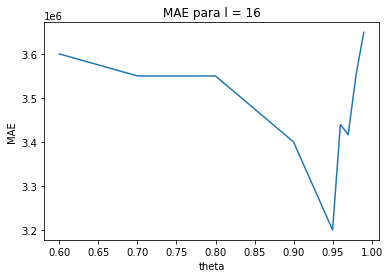

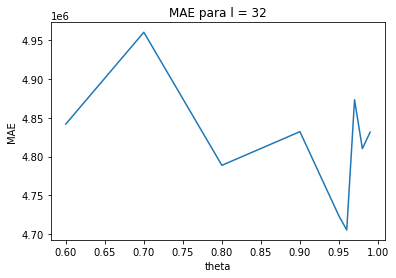

In [62]:
plt.plot(thetas, MAE[:9]) 
# naming the x axis 
plt.xlabel('theta') 
# naming the y axis 
plt.ylabel('MAE') 
  
# giving a title to my graph 
plt.title('MAE para l = 16') 
  
# function to show the plot 
plt.show() 

plt.plot(thetas, MAE[9:18]) 
# naming the x axis 
plt.xlabel('theta') 
# naming the y axis 
plt.ylabel('MAE') 
  
# giving a title to my graph 
plt.title('MAE para l = 32') 
  
# function to show the plot 
plt.show() 

## Conclusiones
1. PCA reduce considerablemente la dimensión del conjunto de entrenamiento, para el conjunto de datos elegido se vió que los datos se pueden describir casi en su totalidad por menos del 10% del total de datos.
2. Los parches elegidos de manera aletoria juegan un papel importante para el entrenamiento. Como se observa en las gráficas, no siempre se mejora el desempeño con un $ \theta $ más grande. Esto se puede pensar en el sentido de que los parches elegidos no siempre contienen información relevante (como texturas, bordes, cambios de color).